## III. Ripple detection by day

In [2]:
%reload_ext autoreload
%autoreload 2

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import spikeinterface as si
import pynwb
from scipy.stats import zscore
from spyglass.common.common_interval import _intersection
from spyglass.common import (IntervalPositionInfo, IntervalPositionInfoSelection, IntervalList, 
                             ElectrodeGroup, LFP, BrainRegion, LFPBand, Electrode)
from ripple_detection import Kay_ripple_detector
from ripple_detection.core import (gaussian_smooth,
                                   get_envelope,
                                   get_multiunit_population_firing_rate,
                                   threshold_by_zscore,
                                   segment_boolean_series,
                                   exclude_close_events,
                                   exclude_movement,
                                   extend_threshold_to_mean)
from ripple_detection.detectors import Kay_ripple_detector,multiunit_HSE_detector
from spyglass.utils.nwb_helper_fn import get_nwb_copy_filename

from spyglass.spikesorting import (SortGroup, 
                                    SortInterval,
                                    SpikeSortingPreprocessingParameters,
                                    SpikeSortingRecording, 
                                    SpikeSorterParameters,
                                    SpikeSortingRecordingSelection,
                                    ArtifactDetectionParameters, ArtifactDetectionSelection,
                                    ArtifactRemovedIntervalList, ArtifactDetection,
                                      SpikeSortingSelection, SpikeSorting,)

from spyglass.shijiegu.Analysis_SGU import TrialChoice,RippleTimes

from spyglass.common.common_position import IntervalLinearizedPosition

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/__init__.py:46: DeprecationWarning: `np.typeDict` is a deprecated alias for `np.sctypeDict`.
  from ._conv import register_converters as _register_converters
[2023-06-20 22:32:03,677][INFO]: Connecting shijiegu@lmf-db.cin.ucsf.edu:3306
[2023-06-20 22:32:03,724][INFO]: Connected shijiegu@lmf-db.cin.ucsf.edu:3306
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/position_tools/core.py:3: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


In [4]:
def interval_union(interval_list1,interval_list2):
    '''
    interval_list1 : np.array, (N,2) where N = number of intervals
    interval_list2 : np.array, (N,2) where N = number of intervals
    
    e.g.
    interval_list1 = np.array([[1,11],[6,8],[12,20],[25,30]])
    interval_list2 = np.array([[1,10]])
    
    Returns
    -------
    interval_list: np.array, (N,2)

    '''
    interval_list1=interval_list1.tolist()
    interval_list2=interval_list2.tolist()
    
    # find all pairwise intersections
    intersect_tally=np.zeros((len(interval_list1),len(interval_list2)))
    for i in range(len(interval_list1)):
        for j in range(len(interval_list2)):
            if _intersection(interval_list1[i],interval_list2[j]) is not None:
                intersect_tally[i,j]=1

    union_set=[]
    union_list2_ind=np.argwhere(np.sum(intersect_tally,axis=0)==0).ravel()
    union_list1_ind=np.argwhere(np.sum(intersect_tally,axis=1)==0).ravel()

    # for those in set 1 or set 2 that has no intersections, append zero row sum or column sum 
    for i in union_list1_ind:
        union_set.append(interval_list1[i])
    for i in union_list2_ind:
        union_set.append(interval_list2[i])
    
    # for those that has intersections, find mutually intersecting interva;s
    for i in np.argwhere(np.sum(intersect_tally,axis=1)!=0).ravel():
        intvl_1=np.array([interval_list1[i]])
        
        intvl_1s=[]
        # first, find the intersecting one in set 2
        j_all=np.argwhere(intersect_tally[i,:]).ravel()
        intvl_2s=np.array([interval_list2[j] for j in j_all])
        
        # then track back in set 1, to find all the ones in set 1 intersecting this one in set 2
        for j in j_all:
            i_all=np.argwhere(intersect_tally[:,j]).ravel()
            for i in i_all:
                intvl_1s.append(interval_list1[i])
        
        # put all the related/intersecting intervals together, find union
        union_tmp=np.concatenate([np.array(intvl_1s),intvl_2s],axis=0)
        
        union_set.append([np.min(union_tmp[:,0]),np.max(union_tmp[:,1])])
    union_set=np.unique(union_set,axis=0)   
    return union_set

In [5]:
def Gu_ripple_detector(time, filtered_lfps, speed, sampling_frequency,
                        speed_threshold=5.0, minimum_duration=0.015,
                        zscore_threshold=2.0, smoothing_sigma=0.004,
                        close_ripple_threshold=0.0):
    '''Find start and end times of sharp wave ripple events (150-250 Hz)
    based on Kay et al. 2016 [1].

    Parameters
    ----------
    time : array_like, shape (n_time,)
    filtered_lfps : array_like, shape (n_time, n_signals)
        Bandpass filtered time series of electric potentials in the ripple band
    speed : array_like, shape (n_time,)
        Running speed of animal
    sampling_frequency : float
        Number of samples per second.
    speed_threshold : float, optional
        Maximum running speed of animal for a ripple
    minimum_duration : float, optional
        Minimum time the z-score has to stay above threshold to be
        considered a ripple. The default is given assuming time is in
        units of seconds.
    zscore_threshold : float, optional
        Number of standard deviations the ripple power must exceed to
        be considered a ripple
    smoothing_sigma : float, optional
        Amount to smooth the time series over time. The default is
        given assuming time is in units of seconds.
    close_ripple_threshold : float, optional
        Exclude ripples that occur within `close_ripple_threshold` of a
        previously detected ripple.

    Returns
    -------
    ripple_times : pandas DataFrame

    References
    ----------
    .. [1] Kay, K., Sosa, M., Chung, J.E., Karlsson, M.P., Larkin, M.C.,
    and Frank, L.M. (2016). A hippocampal network for spatial coding during
    immobility and sleep. Nature 531, 185-190.

    '''
    filtered_lfps = np.asarray(filtered_lfps)
    not_null = np.all(pd.notnull(filtered_lfps), axis=1)
    filtered_lfps, speed, time = (
        filtered_lfps[not_null], speed[not_null], time[not_null])

    filtered_lfps = get_envelope(filtered_lfps)
    combined_filtered_lfps = np.mean(filtered_lfps ** 2, axis=1)
    combined_filtered_lfps = gaussian_smooth(
        combined_filtered_lfps, smoothing_sigma, sampling_frequency)
    combined_filtered_lfps = np.sqrt(combined_filtered_lfps)
    
    imobility_ind=np.logical_or(speed>speed_threshold,np.isnan(speed))
    combined_filtered_lfps[imobility_ind]=np.nan
    speed[imobility_ind]=np.nan
    time[imobility_ind]=np.nan
    
    candidate_ripple_times = threshold_by_zscore(
        combined_filtered_lfps, time, minimum_duration, zscore_threshold)
    ##### find threshold
    ripple_threshold=np.nanmean(combined_filtered_lfps
                               )+zscore_threshold*np.nanstd(combined_filtered_lfps)
    print(ripple_threshold)
    ###################
    ripple_times = exclude_movement(
        candidate_ripple_times, speed, time,
        speed_threshold=speed_threshold)
    ripple_times = exclude_close_events(
        ripple_times, close_ripple_threshold)
    index = pd.Index(np.arange(len(ripple_times)) + 1,
                     name='ripple_number')
    return pd.DataFrame(ripple_times, columns=['start_time', 'end_time'],
                        index=index)

In [9]:
def interpolate_to_new_time(df, new_time, upsampling_interpolation_method='linear'):
    old_time = df.index
    new_index = pd.Index(np.unique(np.concatenate(
        (old_time, new_time))), name='time')
    return (df
            .reindex(index=new_index)
            .interpolate(method=upsampling_interpolation_method)
            .reindex(index=new_time))

def get_Kay_ripple_consensus_trace(ripple_filtered_lfps, sampling_frequency,
                                   smoothing_sigma=0.004):
    ripple_consensus_trace = np.full_like(ripple_filtered_lfps, np.nan)
    not_null = np.all(pd.notnull(ripple_filtered_lfps), axis=1)

    ripple_consensus_trace[not_null] = get_envelope(
        np.asarray(ripple_filtered_lfps)[not_null])
    ripple_consensus_trace = np.sum(ripple_consensus_trace ** 2, axis=1)
    ripple_consensus_trace[not_null] = gaussian_smooth(
        ripple_consensus_trace[not_null], smoothing_sigma, sampling_frequency)
    return np.sqrt(ripple_consensus_trace)

def plot_ripple(lfps, ripple_times, ripple_label=1,  offset=0.100, relative=True):
    lfp_labels = lfps.columns
    n_lfps = len(lfp_labels)
    ripple_start = ripple_times.loc[ripple_label].start_time
    ripple_end = ripple_times.loc[ripple_label].end_time
    time_slice = slice(ripple_start - offset,
                       ripple_end + offset)
    fig, ax = plt.subplots(1, 1, figsize=(12, n_lfps * 0.20))
    
    start_offset = ripple_start if relative else 0

    for lfp_ind, lfp_label in enumerate(lfp_labels):
        lfp = lfps.loc[time_slice, lfp_label]
        ax.plot(lfp.index - start_offset, lfp_ind + (lfp - lfp.mean()) / (lfp.max() - lfp.min()),
                color='black')

    ax.axvspan(ripple_start - start_offset, ripple_end - start_offset, zorder=-1, alpha=0.5, color='lightgrey')
    ax.set_ylim((-1, n_lfps))
    ax.set_xlim((time_slice.start - start_offset, time_slice.stop - start_offset))
    ax.set_ylabel('LFPs')
    ax.set_xlabel('Time [s]')

In [20]:
nwb_file_name = 'eliot20221024.nwb'


nwb_copy_file_name=get_nwb_copy_filename(nwb_file_name)

In [21]:
(LFPBand & {'nwb_file_name': nwb_copy_file_name})

nwb_file_name name of the NWB file,filter_name descriptive name of this filter,filter_sampling_rate sampling rate for this filter,target_interval_list_name descriptive name of this interval list,lfp_band_sampling_rate the sampling rate for this band,analysis_file_name name of the file,interval_list_name descriptive name of this interval list,filtered_data_object_id the NWB object ID for loading this object from the file
eliot20221024_.nwb,Ripple 150-250 Hz,1000,02_Seq2Session2,1000,eliot20221024_IGTFG6YOGR.nwb,02_Seq2Session2 lfp band 1000Hz,3819eda0-5f06-4dab-88e1-2119e1b31761
eliot20221024_.nwb,Ripple 150-250 Hz,1000,04_Seq2Session3,1000,eliot20221024_GZ3F85TAII.nwb,04_Seq2Session3 lfp band 1000Hz,5fc42cfa-8000-43a7-8b7d-9333e4a36120
eliot20221024_.nwb,Ripple 150-250 Hz,1000,06_Seq2Session4,1000,eliot20221024_K1IDU7I7ZR.nwb,06_Seq2Session4 lfp band 1000Hz,89cca255-eea4-42ba-98fc-a6fd89808ff4
eliot20221024_.nwb,Ripple 150-250 Hz,1000,08_Seq2Session5,1000,eliot20221024_53SU0Y1D30.nwb,08_Seq2Session5 lfp band 1000Hz,0a7c46ed-585a-49e2-a9ea-2dec6716f966
eliot20221024_.nwb,Ripple 150-250 Hz,1000,10_Seq2Session6,1000,eliot20221024_IL38H2B82S.nwb,10_Seq2Session6 lfp band 1000Hz,6b3ce0c5-2d46-4341-8558-3e52f8d9e402


In [22]:
def batch_ripple_detection(nwb_copy_file_name,pos_interval_list_name,interval_list_name):
    
    # Position
    position_info_param_name = 'default'
    position_valid_times = (IntervalList & {'nwb_file_name': nwb_copy_file_name,
                                            'interval_list_name': pos_interval_list_name}).fetch1('valid_times')

    position_info = (IntervalPositionInfo() & {'nwb_file_name': nwb_copy_file_name,
                     'interval_list_name': pos_interval_list_name,
                     'position_info_param_name': position_info_param_name}).fetch1_dataframe()

    position_info = pd.concat(
        [position_info.loc[slice(valid_time[0], valid_time[1])]
         for valid_time in position_valid_times], axis=0)
    
    # Ripple, remove artifact times (interpolate)
    ripple_nwb_file_path = (LFPBand & {'nwb_file_name': nwb_copy_file_name,
                             'target_interval_list_name': interval_list_name,
                             'filter_name': 'Ripple 150-250 Hz'}).fetch1('analysis_file_name')
    try: #2nd running this
        with pynwb.NWBHDF5IO('/stelmo/nwb/analysis/'+nwb_file_name[:-4]+'/'+ripple_nwb_file_path, 'r',load_namespaces=True) as io:
            ripple_nwb = io.read()
            filtered_data=np.array(ripple_nwb.scratch['artifact removed filtered data'].data)
            ripple_timestamps=np.array(ripple_nwb.scratch['artifact removed filtered data'].timestamps)
            electrodes=ripple_nwb.scratch['artifact removed filtered data'].electrodes

            ripple_lfp = np.concatenate(
                [ripple_nwb.scratch['artifact removed filtered data'].data[
                    np.logical_and(ripple_timestamps>=valid_time[0],ripple_timestamps<=valid_time[1]),:] 
                 for valid_time in position_valid_times], axis=0)

            ripple_lfp_t = np.concatenate(
                [ripple_timestamps[np.logical_and(ripple_timestamps>=valid_time[0],ripple_timestamps<=valid_time[1])]
                 for valid_time in position_valid_times])
    except: #1st time running this
        with pynwb.NWBHDF5IO('/stelmo/nwb/analysis/'+nwb_file_name[:-4]+'/'+ripple_nwb_file_path, 'r+',load_namespaces=True) as io:
            ripple_nwb = io.read()
            filtered_data=np.array(ripple_nwb.scratch['filtered data'].data)
            ripple_timestamps=np.array(ripple_nwb.scratch['filtered data'].timestamps)
            electrodes=ripple_nwb.scratch['filtered data'].electrodes

            ripple_lfp = np.concatenate(
                [ripple_nwb.scratch['filtered data'].data[
                    np.logical_and(ripple_timestamps>=valid_time[0],ripple_timestamps<=valid_time[1]),:] 
                 for valid_time in position_valid_times], axis=0)

            ripple_lfp_t = np.concatenate(
                [ripple_timestamps[np.logical_and(ripple_timestamps>=valid_time[0],ripple_timestamps<=valid_time[1])]
                 for valid_time in position_valid_times])

            '''artifact time to nan'''
            artifact_times_100=(ArtifactRemovedIntervalList()
                                & {'nwb_file_name': nwb_copy_file_name,
                                   'sort_interval_name':interval_list_name,
                                   'sort_group_id':100}).fetch1('artifact_times')
            artifact_times_101=(ArtifactRemovedIntervalList()
                                & {'nwb_file_name': nwb_copy_file_name,
                                   'sort_interval_name':interval_list_name,
                                   'sort_group_id':101}).fetch1('artifact_times')
            artifact_time_list=interval_union(artifact_times_100,artifact_times_101)

            for artifact_time in artifact_time_list:
                ripple_lfp[np.logical_and(ripple_lfp_t>=artifact_time[0],
                                          ripple_lfp_t<=artifact_time[1]),:]=-32767 #the smallest number in int16

            nan_ind=(ripple_lfp[:,1]==-32767).ravel()

            for t in range(ripple_lfp.shape[1]):
                ripple_lfp[nan_ind,t]= np.interp(ripple_lfp_t[nan_ind], ripple_lfp_t[~nan_ind], ripple_lfp[~nan_ind,t])

            # write processed ripple data back to nwb
            for valid_time in position_valid_times:
                filtered_data[np.logical_and(ripple_timestamps>=valid_time[0],
                                         ripple_timestamps<=valid_time[1]),
                          :]=ripple_lfp[np.logical_and(ripple_lfp_t>=valid_time[0],
                                                       ripple_lfp_t<=valid_time[1]),:]

            eseries_name = 'artifact removed filtered data'
            es = pynwb.ecephys.ElectricalSeries(name=eseries_name,
                                                data=filtered_data,
                                                electrodes=electrodes,
                                                timestamps=ripple_timestamps)

            ripple_nwb.add_scratch(es)

            io.write(ripple_nwb)
        
    # upsample position
    position_info_upsample = interpolate_to_new_time(position_info, ripple_lfp_t)
        
    # method 2
    lfp_band_sampling_rate=(LFPBand & {'nwb_file_name': nwb_copy_file_name,
                             'target_interval_list_name': interval_list_name,
                             'filter_name': 'Ripple 150-250 Hz'}).fetch1('lfp_band_sampling_rate')
    lfp_band_sampling_rate

    ripple_times = Gu_ripple_detector(
        time=ripple_lfp_t,
        filtered_lfps=ripple_lfp.astype('int32'), #super important to do int32
        speed=np.asarray(position_info_upsample.head_speed),
        sampling_frequency=lfp_band_sampling_rate,
        zscore_threshold=0.4, #1.0 for molly,
        minimum_duration=0.015)

    key={'nwb_file_name':nwb_copy_file_name,
     'interval_list_name':interval_list_name,
     'ripple_times_04sd':ripple_times.to_dict()}
    RippleTimes().insert1(key,replace=True)

In [23]:
# select position timestamps, only maze sessions are selected
IntervalList_pd=pd.DataFrame(IntervalList & {'nwb_file_name': nwb_copy_file_name})

# because LFP band intervals are in the IntervalList_pd, they mess up indices. we delete these
del_ind=[]
for i in IntervalList_pd.index:
    interval=IntervalList_pd['interval_list_name'][i]
    if "lfp" in interval:
        del_ind.append(i)
IntervalList_pd=IntervalList_pd.drop(del_ind, axis=0)
IntervalList_pd.reset_index(inplace=True)

position_interval=[]
session_interval=[]
for i in IntervalList_pd.index:
    interval=IntervalList_pd['interval_list_name'][i]
    if interval[-8:-1]=='Session':
        session_interval.append(interval)
        pos_interval='pos '+str(i)+' valid times'
        position_interval.append(pos_interval)
print(session_interval)
print(position_interval)

['02_Seq2Session2', '04_Seq2Session3', '06_Seq2Session4', '08_Seq2Session5', '10_Seq2Session6']
['pos 1 valid times', 'pos 3 valid times', 'pos 5 valid times', 'pos 7 valid times', 'pos 9 valid times']


In [24]:
for i in [1,2,3,4]:#range(len(session_interval)):
    pos_interval_list_name=position_interval[i]
    interval_list_name=session_interval[i]
    batch_ripple_detection(nwb_copy_file_name,
                           pos_interval_list_name,interval_list_name)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8

20.74085932046078


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8

21.2358894100638


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8

21.14864620443101


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8

20.57956723007565


In [25]:
RippleTimes & {'nwb_file_name':nwb_copy_file_name}

nwb_file_name name of the NWB file,interval_list_name descriptive name of this interval list,ripple_times ripple times within that interval,ripple_times_04sd ripple times within that interval,ripple_times_1sd ripple times within that interval,ripple_times_2sd ripple times within that interval
eliot20221024_.nwb,04_Seq2Session3,=BLOB=,=BLOB=,=BLOB=,=BLOB=
eliot20221024_.nwb,06_Seq2Session4,=BLOB=,=BLOB=,=BLOB=,=BLOB=
eliot20221024_.nwb,08_Seq2Session5,=BLOB=,=BLOB=,=BLOB=,=BLOB=
eliot20221024_.nwb,10_Seq2Session6,=BLOB=,=BLOB=,=BLOB=,=BLOB=


In [149]:
pd.DataFrame((RippleTimes & {'nwb_file_name':nwb_copy_file_name,
              'interval_list_name':'06_Seq2Session3'}).fetch1('ripple_times_04sd'))

,start_time,end_time
1,1.666560e+09,1.666560e+09
2,1.666560e+09,1.666560e+09
3,1.666560e+09,1.666560e+09
4,1.666560e+09,1.666560e+09
5,1.666560e+09,1.666560e+09
...,...,...
2864,1.666562e+09,1.666562e+09
2865,1.666562e+09,1.666562e+09
2866,1.666562e+09,1.666562e+09
2867,1.666562e+09,1.666562e+09


## End here

#### Load Neural Data

In [10]:
SpikeSortingRecording & {'nwb_file_name' : nwb_copy_file_name,'sort_interval_name' : interval_list_name}

nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,recording_path,sort_interval_list_name descriptive name of this interval list
eliot20221025_.nwb,0,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/eliot20221025_.nwb_02_Seq2Session1_0_franklab_tetrode_hippocampus,eliot20221025_.nwb_02_Seq2Session1_0_franklab_tetrode_hippocampus
eliot20221025_.nwb,2,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/eliot20221025_.nwb_02_Seq2Session1_2_franklab_tetrode_hippocampus,eliot20221025_.nwb_02_Seq2Session1_2_franklab_tetrode_hippocampus
eliot20221025_.nwb,4,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/eliot20221025_.nwb_02_Seq2Session1_4_franklab_tetrode_hippocampus,eliot20221025_.nwb_02_Seq2Session1_4_franklab_tetrode_hippocampus
eliot20221025_.nwb,5,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/eliot20221025_.nwb_02_Seq2Session1_5_franklab_tetrode_hippocampus,eliot20221025_.nwb_02_Seq2Session1_5_franklab_tetrode_hippocampus
eliot20221025_.nwb,13,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/eliot20221025_.nwb_02_Seq2Session1_13_franklab_tetrode_hippocampus,eliot20221025_.nwb_02_Seq2Session1_13_franklab_tetrode_hippocampus
eliot20221025_.nwb,14,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/eliot20221025_.nwb_02_Seq2Session1_14_franklab_tetrode_hippocampus,eliot20221025_.nwb_02_Seq2Session1_14_franklab_tetrode_hippocampus
eliot20221025_.nwb,16,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/eliot20221025_.nwb_02_Seq2Session1_16_franklab_tetrode_hippocampus,eliot20221025_.nwb_02_Seq2Session1_16_franklab_tetrode_hippocampus
eliot20221025_.nwb,17,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/eliot20221025_.nwb_02_Seq2Session1_17_franklab_tetrode_hippocampus,eliot20221025_.nwb_02_Seq2Session1_17_franklab_tetrode_hippocampus
eliot20221025_.nwb,20,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/eliot20221025_.nwb_02_Seq2Session1_20_franklab_tetrode_hippocampus,eliot20221025_.nwb_02_Seq2Session1_20_franklab_tetrode_hippocampus
eliot20221025_.nwb,26,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/eliot20221025_.nwb_02_Seq2Session1_26_franklab_tetrode_hippocampus,eliot20221025_.nwb_02_Seq2Session1_26_franklab_tetrode_hippocampus


In [16]:
interval_list_name='02_Seq2Session1'
pos_interval_list_name='pos 1 valid times'
tetrode=0

In [12]:
#obtain neural data
recordings=[]
neural_ts=[]
neural_datas=[]
for tetrode in [100,101]:
    recording_path = (SpikeSortingRecording & {'nwb_file_name' : nwb_copy_file_name,
                                                'sort_interval_name' : interval_list_name,
                                                'sort_group_id' : tetrode}).fetch1('recording_path')
    recording = si.load_extractor(recording_path)
    if recording.get_num_segments() > 1 and isinstance(recording, si.AppendSegmentRecording):
        recording = si.concatenate_recordings(recording.recording_list)
    elif recording.get_num_segments() > 1 and isinstance(recording, si.BinaryRecordingExtractor):
        recording = si.concatenate_recordings([recording])
    neural_data = recording.get_traces() 
    neural_t = SpikeSortingRecording._get_recording_timestamps(recording)
    recordings.append(recording)
    neural_ts.append(neural_t)
    neural_datas.append(neural_data)

neural_data=np.concatenate(neural_datas,axis=1)
mua_time=neural_ts[0]

In [17]:
position_info_param_name = 'default'
position_valid_times = (IntervalList & {'nwb_file_name': nwb_copy_file_name,
                                            'interval_list_name': pos_interval_list_name}).fetch1('valid_times')

position_info = (IntervalPositionInfo() & {'nwb_file_name': nwb_copy_file_name,
                     'interval_list_name': pos_interval_list_name,
                     'position_info_param_name': position_info_param_name}).fetch1_dataframe()

position_info = pd.concat(
        [position_info.loc[slice(valid_time[0], valid_time[1])]
         for valid_time in position_valid_times], axis=0)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8

In [19]:
30000*(mua_time[1]-mua_time[0])

1.0013580322265625

#### detect ripple

In [59]:
# method 1
ripple_times=multiunit_HSE_detector(
    time=mua_time,
    multiunit=neural_data,
    speed=np.asarray(position_info_upsample.head_speed),
    sampling_frequency=30000)

In [22]:
# method 2
ripple_nwb_file_path = (LFPBand & {'nwb_file_name': nwb_copy_file_name,
                             'target_interval_list_name': interval_list_name,
                             'filter_name': 'Ripple 150-250 Hz'}).fetch1('analysis_file_name')
with pynwb.NWBHDF5IO('/stelmo/nwb/analysis/'+nwb_file_name[:-4]+'/'+ripple_nwb_file_path, 'r',load_namespaces=True) as io:
    ripple_nwb = io.read()
    filtered_data=np.array(ripple_nwb.scratch['artifact removed filtered data'].data)
    ripple_timestamps=np.array(ripple_nwb.scratch['artifact removed filtered data'].timestamps)
    electrodes=ripple_nwb.scratch['artifact removed filtered data'].electrodes

    ripple_lfp = np.concatenate(
                [ripple_nwb.scratch['artifact removed filtered data'].data[
                    np.logical_and(ripple_timestamps>=valid_time[0],ripple_timestamps<=valid_time[1]),:] 
                 for valid_time in position_valid_times], axis=0)

    ripple_lfp_t = np.concatenate(
                [ripple_timestamps[np.logical_and(ripple_timestamps>=valid_time[0],ripple_timestamps<=valid_time[1])]
                 for valid_time in position_valid_times])

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8

In [24]:
position_info_upsample = interpolate_to_new_time(position_info, ripple_lfp_t)

In [28]:
# method 2
lfp_band_sampling_rate=(LFPBand & {'nwb_file_name': nwb_copy_file_name,
                             'target_interval_list_name': interval_list_name,
                             'filter_name': 'Ripple 150-250 Hz'}).fetch1('lfp_band_sampling_rate')
lfp_band_sampling_rate

ripple_times = Kay_ripple_detector(
    time=ripple_lfp_t,
    filtered_lfps=ripple_lfp.astype('int32'), #super important to do int32
    speed=np.asarray(position_info_upsample.head_speed),
    sampling_frequency=lfp_band_sampling_rate,
    zscore_threshold=0.4,
    minimum_duration=0.015)

ripple_times

,start_time,end_time
ripple_number,,
1,1.666725e+09,1.666725e+09
2,1.666725e+09,1.666725e+09
3,1.666725e+09,1.666725e+09
4,1.666725e+09,1.666725e+09
5,1.666725e+09,1.666725e+09
...,...,...
398,1.666727e+09,1.666727e+09
399,1.666727e+09,1.666727e+09
400,1.666727e+09,1.666727e+09


In [29]:
RippleTimes().alter()

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/inspect.py:350: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  value = getattr(object, key)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/inspect.py:350: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  value = getattr(object, key)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/inspect.py:350: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  value = getattr(object, key)


ALTER TABLE `shijiegu_trialanalysis`.`ripple_times`
	ADD `ripple_times_04sd` blob DEFAULT NULL COMMENT "ripple times within that interval" AFTER `ripple_times`,
	MODIFY `ripple_times_1sd` blob DEFAULT NULL COMMENT "ripple times within that interval" AFTER `ripple_times_04sd`

Execute? [yes, no]:  yes


[2023-06-14 12:55:50,936][INFO]: Table altered
INFO:datajoint:Table altered


In [30]:
RippleTimes() & {'nwb_file_name':nwb_copy_file_name}

nwb_file_name name of the NWB file,interval_list_name descriptive name of this interval list,ripple_times ripple times within that interval,ripple_times_04sd ripple times within that interval,ripple_times_1sd ripple times within that interval,ripple_times_2sd ripple times within that interval
eliot20221025_.nwb,02_Seq2Session1,=BLOB=,=BLOB=,=BLOB=,=BLOB=
eliot20221025_.nwb,04_Seq2Session2,=BLOB=,=BLOB=,=BLOB=,=BLOB=
eliot20221025_.nwb,06_Seq2Session3,=BLOB=,=BLOB=,=BLOB=,=BLOB=
eliot20221025_.nwb,08_Seq2Session4,=BLOB=,=BLOB=,=BLOB=,=BLOB=


In [23]:
key={'nwb_file_name':nwb_copy_file_name,
     'interval_list_name':interval_list_name,
     'ripple_times_1sd':ripple_times.to_dict()}
RippleTimes().insert1(key,replace=True)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:191: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.Mapping):


In [24]:
(ripple_times.loc[159,'start_time']-ripple_times.loc[1,'start_time'])/60

6.893125951290131

#### plot ripples

In [19]:
from spyglass.common import LFPSelection

In [20]:
LFPSelection.LFPElectrode & {'nwb_file_name' : nwb_copy_file_name}

nwb_file_name name of the NWB file,electrode_group_name electrode group name from NWBFile,electrode_id the unique number for this electrode
molly20220416_.nwb,15,60
molly20220416_.nwb,15,61
molly20220416_.nwb,15,62
molly20220416_.nwb,15,63
molly20220416_.nwb,16,64
molly20220416_.nwb,18,72
molly20220416_.nwb,18,73
molly20220416_.nwb,18,74
molly20220416_.nwb,18,75
molly20220416_.nwb,25,100


In [21]:
(SpikeSortingRecording & {'nwb_file_name' : nwb_copy_file_name,
                                               'sort_interval_name' : sort_interval_name,
                                               })

nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,recording_path,sort_interval_list_name descriptive name of this interval list
molly20220416_.nwb,3,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/molly20220416_.nwb_02_Seq2Session1_3_franklab_tetrode_hippocampus,molly20220416_.nwb_02_Seq2Session1_3_franklab_tetrode_hippocampus
molly20220416_.nwb,6,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/molly20220416_.nwb_02_Seq2Session1_6_franklab_tetrode_hippocampus,molly20220416_.nwb_02_Seq2Session1_6_franklab_tetrode_hippocampus
molly20220416_.nwb,7,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/molly20220416_.nwb_02_Seq2Session1_7_franklab_tetrode_hippocampus,molly20220416_.nwb_02_Seq2Session1_7_franklab_tetrode_hippocampus
molly20220416_.nwb,9,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/molly20220416_.nwb_02_Seq2Session1_9_franklab_tetrode_hippocampus,molly20220416_.nwb_02_Seq2Session1_9_franklab_tetrode_hippocampus
molly20220416_.nwb,15,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/molly20220416_.nwb_02_Seq2Session1_15_franklab_tetrode_hippocampus,molly20220416_.nwb_02_Seq2Session1_15_franklab_tetrode_hippocampus
molly20220416_.nwb,18,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/molly20220416_.nwb_02_Seq2Session1_18_franklab_tetrode_hippocampus,molly20220416_.nwb_02_Seq2Session1_18_franklab_tetrode_hippocampus
molly20220416_.nwb,25,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/molly20220416_.nwb_02_Seq2Session1_25_franklab_tetrode_hippocampus,molly20220416_.nwb_02_Seq2Session1_25_franklab_tetrode_hippocampus
molly20220416_.nwb,34,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/molly20220416_.nwb_02_Seq2Session1_34_franklab_tetrode_hippocampus,molly20220416_.nwb_02_Seq2Session1_34_franklab_tetrode_hippocampus
molly20220416_.nwb,36,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/molly20220416_.nwb_02_Seq2Session1_36_franklab_tetrode_hippocampus,molly20220416_.nwb_02_Seq2Session1_36_franklab_tetrode_hippocampus
molly20220416_.nwb,37,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,/stelmo/nwb/recording/molly20220416_.nwb_02_Seq2Session1_37_franklab_tetrode_hippocampus,molly20220416_.nwb_02_Seq2Session1_37_franklab_tetrode_hippocampus


In [230]:
import spikeinterface as si

tetrodes=[100,101]
session_name='02_Seq2Session1'
sort_interval_name='02_Seq2Session1'
artifact_params_name='ampl_100_prop_05_2ms'

'''get session start time'''
session_start_end=(IntervalList & {'nwb_file_name' : nwb_copy_file_name,'interval_list_name':session_name}).fetch1('valid_times')

'''obtain neural data'''
recordings=[]
neural_ts=[]
for tetrode in tetrodes:
    recording_path = (SpikeSortingRecording & {'nwb_file_name' : nwb_copy_file_name,
                                               'sort_interval_name' : sort_interval_name,
                                               'sort_group_id' : tetrode}).fetch1('recording_path')
    recording = si.load_extractor(recording_path)
    if recording.get_num_segments() > 1 and isinstance(recording, si.AppendSegmentRecording):
        recording = si.concatenate_recordings(recording.recording_list)
    elif recording.get_num_segments() > 1 and isinstance(recording, si.BinaryRecordingExtractor):
        recording = si.concatenate_recordings([recording])
    neural_t = SpikeSortingRecording._get_recording_timestamps(recording)
    recordings.append(recording)
    neural_ts.append(neural_t)


'''broad band data'''
broadband_nwb=(LFP() & {'nwb_file_name' : nwb_copy_file_name}).fetch_nwb()[0]
broadband_t=broadband_nwb['lfp'].timestamps

'''ripple band data'''
filter_name = 'Ripple 150-250 Hz'
ripple_nwb = (LFPBand & {'nwb_file_name': nwb_copy_file_name,
                             'target_interval_list_name': interval_list_name,
                             'filter_name': filter_name}).fetch_nwb()[0]
ripple_t=ripple_nwb['filtered_data'].timestamps


'''artifact time'''
artifact_plot_times=[]
for tetrode in tetrodes:
    artifact_plot_time = (ArtifactDetection 
                       & {'nwb_file_name' : nwb_copy_file_name} 
                       & {'sort_interval_name' : sort_interval_name} 
                       & {'sort_group_id' : tetrode}
                       & {'artifact_params_name': artifact_params_name}).fetch1('artifact_times')
    artifact_plot_times.append(artifact_plot_time)
artifact_plot_times=np.concatenate(artifact_plot_times)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_FAT9AKG1K4.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_3VNDUKRCP7.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)


In [662]:
neural_datas[1].shape

(18929, 56)

In [195]:
np.max(largenum)

11

In [154]:
# 11,15,51

(17939,)

In [ ]:
# 37,40,41,46,50,64,67,140

In [ ]:
#103,150,33,18

In [200]:
ripple_consensus_trace = np.full_like(ripple_data, np.nan)
not_null = np.all(pd.notnull(ripple_data), axis=1)
ripple_consensus_trace[not_null] = get_envelope(
        np.asarray(ripple_data)[not_null])
ripple_consensus_trace = np.sum(ripple_consensus_trace ** 2, axis=1)

In [201]:
ripple_consensus_trace

array([  13514,   44667,   68786,   79452,   80829,   75261,   70123,
         63535,   52908,   43393,   40243,   41177,   45249,   51402,
         56964,   57463,   53152,   46602,   39360,   34306,   31942,
         29515,   28216,   30227,   41345,   69753,  130394,  234651,
        387744,  590480,  832477, 1088953, 1321443, 1497252, 1590651,
       1581623, 1473193, 1278303, 1026350,  749705,  489912,  282448,
        139557,   57666,   26265,   31334,   49999,   65212,   76765,
         81524,   74111,   57800,   31042])

In [186]:
np.sum(np.isnan(ripple_consensus_trace))

0

In [41]:

ripple_consensus_trace[not_null] = gaussian_smooth(
    ripple_consensus_trace[not_null], smoothing_sigma, sampling_frequency)

0

In [231]:
ripple_with_artifacts=[]
for ri in range(1,158):
    plottimes = [ripple_times.loc[ri].start_time,
             ripple_times.loc[ri].end_time] 
    artifact_data=[at for at in artifact_plot_times if np.logical_and(at[0]>=plottimes[0],at[1]<=plottimes[1])]
    if len(artifact_data)>0:
        ripple_with_artifacts.append(ri)
len(ripple_with_artifacts)

9

37
[array([1.65013762e+09, 1.65013762e+09]), array([1.65013762e+09, 1.65013762e+09]), array([1.65013762e+09, 1.65013762e+09])]


/tmp/ipykernel_4030659/50152980.py:77: RuntimeWarning: invalid value encountered in true_divide
  ripple_data_=(ripple_data_-ripple_data_.mean())/(ripple_data_.max()-ripple_data_.min())


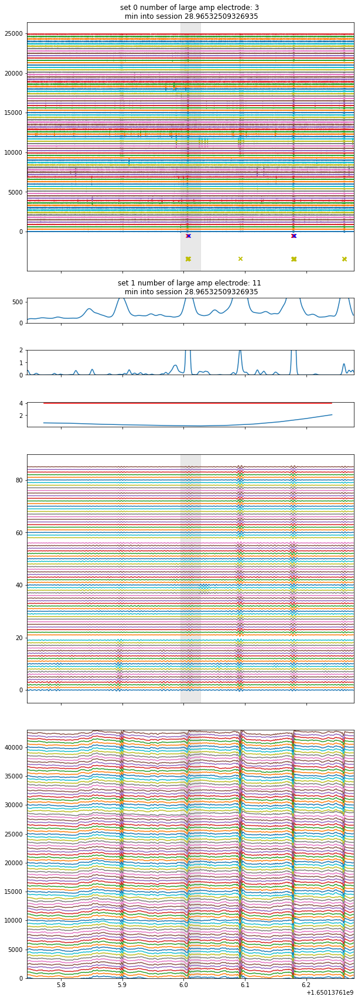

In [242]:
#ripple_num=ripple_num+1
#ripple_num=0
#ri=0
ri=ri+1
ripple_num=ripple_with_artifacts[ri]
print(ripple_num)
offset=0.25

plottimes = [ripple_times.loc[ripple_num].start_time - offset,
             ripple_times.loc[ripple_num].end_time + offset] 
# Animal speed
speed_t=np.array(position_info.index)
speed_ind=slice(plottimes[0],plottimes[1])
speed_time=np.array(position_info.loc[speed_ind,'head_speed'].index)
speed_data=np.array(position_info.loc[speed_ind,'head_speed'])

# Spike band
neural_times=[]
neural_datas=[]
for g in range(len(neural_ts)):
    neural_t=neural_ts[g]
    recording=recordings[g]
    orig_time_ind = np.argwhere(np.logical_and(neural_t >= plottimes[0], neural_t < plottimes[1])).ravel()
    neural_data = recording.get_traces(start_frame=orig_time_ind[0], end_frame=orig_time_ind[-1]+1)
    neural_time=neural_t[orig_time_ind]
    time_into_recording=(np.mean(plottimes)-session_start_end[0][0])/60
    neural_times.append(neural_time)
    neural_datas.append(neural_data)
neural_data=np.concatenate(neural_datas,axis=1)
neural_time=neural_times[0]

# LFP band data
broad_lfp_ind = np.argwhere(np.logical_and(broadband_t >= plottimes[0], broadband_t < plottimes[1])).ravel()
broadband_data = broadband_nwb['lfp'].data[broad_lfp_ind,:].astype('int32')
broadband_time = broadband_t[broad_lfp_ind]

# Ripple band data
ripple_t_ind = np.argwhere(np.logical_and(ripple_t >= plottimes[0], ripple_t < plottimes[1])).ravel()
ripple_data = ripple_nwb['filtered_data'].data[ripple_t_ind,:].astype('int32')
ripple_time = ripple_t[ripple_t_ind]

# Consensus
ripple_consensus_trace = get_Kay_ripple_consensus_trace(
    ripple_data, ripple_nwb['lfp_band_sampling_rate'],smoothing_sigma=0.004)

# 2 ms * 30 sample/ms
mua=get_multiunit_population_firing_rate(np.abs(neural_data)>=100,30000,smoothing_sigma=60/30000)

# Artifact times
artifact_data=[at for at in artifact_plot_times if np.logical_and(at[0]>=plottimes[0],at[1]<=plottimes[1])]
print(artifact_data)

fig, axes = plt.subplots(nrows=6,gridspec_kw={'height_ratios': [10,1,1,1,10,10]},sharex=True,figsize=(10,30))
numtrodes=np.shape(neural_data)[1]
for i in range(numtrodes):
    axes[0].plot(neural_time, neural_data[:,i]+i*300)

axes[1].plot(ripple_time,ripple_consensus_trace)
axes[1].set_ylim(0,600)

axes[2].plot(neural_time,mua/numtrodes)
axes[2].set_ylim(0,2)

axes[3].plot(speed_time,speed_data)
axes[3].plot([speed_time[0],speed_time[-1]],[4,4],'r')

numtrodes=np.shape(broadband_data)[1]
for i in range(numtrodes):
    #broadband_data_=broadband_data[:,i]
    #broadband_data_=(broadband_data_-broadband_data_.mean())/(broadband_data_.max()-broadband_data_.min())
    axes[5].plot(broadband_time, broadband_data[:,i]+i*500)
axes[5].set_ylim(0,numtrodes*500)

numtrodes=np.shape(ripple_data)[1]
for i in range(numtrodes):
    ripple_data_=ripple_data[:,i]
    ripple_data_=(ripple_data_-ripple_data_.mean())/(ripple_data_.max()-ripple_data_.min())
    axes[4].plot(ripple_time, ripple_data_+i*1)

# times when more than 20 tetrodes of more than >150 uV
tetrode_threshnum=[14,28]
for g in range(len(neural_ts)):
    largenum=np.sum(np.abs(neural_datas[g])>70,axis=1)
    artifact_plot_times_=neural_time[np.argwhere(largenum>tetrode_threshnum[g]).ravel()]
    #print('g',g,artifact_plot_times_)
    axes[0].scatter(artifact_plot_times_, np.repeat(-3500+100*g,artifact_plot_times_.shape[0]),marker='x',color='y')
    axes[g].set_title('set '+str(g)+' number of large amp electrode: '+str(np.max(largenum))+' \n min into session '+str(time_into_recording))
    
    largenum=np.sum(np.abs(neural_datas[g])>150,axis=1) #70
    artifact_plot_times_=neural_time[np.argwhere(largenum>tetrode_threshnum[g]).ravel()] #30
    #print('g',g,artifact_plot_times_)
    axes[0].scatter(artifact_plot_times_, np.repeat(-2500+1000*g,artifact_plot_times_.shape[0]),marker='x',color='g')
    axes[g].set_title('set '+str(g)+' number of large amp electrode: '+str(np.max(largenum))+' \n min into session '+str(time_into_recording))

# start and end time of artifact
if len(artifact_data)>0:
    for artifact_t in artifact_data:
        axes[0].scatter(artifact_t[0], -500,marker='x',color='r')
        axes[0].scatter(artifact_t[1], -500,marker='x',color='b')

plt.xlim(plottimes[0],plottimes[1])

axes[0].axvspan(plottimes[0]+offset,plottimes[1]-offset, zorder=-1, alpha=0.5, color='lightgrey')
axes[4].axvspan(plottimes[0]+offset,plottimes[1]-offset, zorder=-1, alpha=0.5, color='lightgrey')
axes[5].axvspan(plottimes[0]+offset,plottimes[1]-offset, zorder=-1, alpha=0.5, color='lightgrey')

       

In [180]:
ripple_consensus_trace

array([176.33207309, 194.25498707, 209.55906089, 221.69122671,
       230.37795033, 235.66289483, 237.89073122, 237.65310854,
       235.6947178 , 232.78530881, 229.58658497, 226.54800816,
       223.86379788, 221.52652211, 219.46753746, 217.75674502,
       216.80636522, 217.54539756, 221.45202641, 230.32368528,
       245.71528239, 268.24801956, 297.1211874 , 330.10604357,
       363.83100473, 394.18143031, 416.69773218, 426.98711924,
       421.16030202, 396.23982637, 350.42402886, 282.9469915 ,
       192.28364465,  51.68171824,          nan,          nan,
        93.57884376, 210.27838691, 291.8818254 , 350.69787567,
       388.28726479, 406.19699654, 407.04422364, 394.45405309,
       372.63252676, 345.8120877 , 317.66334381, 290.79030245,
       266.45262243, 244.65690262, 224.56847508, 205.11216444,
       185.43732095])

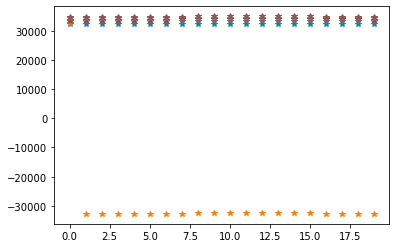

In [108]:
# 65,66
for x in range(64,70):
    plt.plot(broadband_data[10:30,i]+500*x,'*')

In [114]:
(broadband_data[10:30,65]).astype('int32')+500*65

array([32768, 32854, 32869, 32846, 32845, 32861, 32894, 32905, 32922,
       32915, 32874, 32906, 32890, 32832, 32865, 32853, 32789, 32770,
       32759, 32670], dtype=int32)

In [110]:
np.argwhere((broadband_data[:,65]+500*65)<=-30000)

array([[ 10],
       [ 11],
       [ 12],
       [ 13],
       [ 14],
       [ 15],
       [ 16],
       [ 17],
       [ 18],
       [ 19],
       [ 20],
       [ 21],
       [ 22],
       [ 23],
       [ 24],
       [ 25],
       [ 26],
       [ 27],
       [136],
       [137],
       [138],
       [139],
       [140],
       [141],
       [142],
       [143],
       [144],
       [145],
       [147],
       [148],
       [149],
       [150],
       [152],
       [153],
       [154],
       [155],
       [156],
       [159],
       [160],
       [165],
       [166],
       [167],
       [171],
       [172],
       [269],
       [270],
       [271],
       [272],
       [273],
       [274],
       [275],
       [276],
       [277],
       [278],
       [279],
       [280],
       [281],
       [282],
       [283],
       [284],
       [285],
       [286],
       [287],
       [289],
       [290],
       [291],
       [292],
       [293],
       [294],
       [295],
       [296],
      

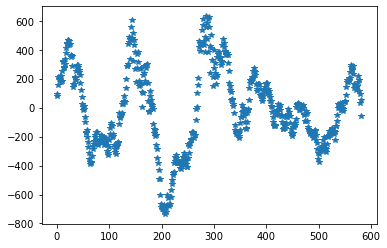

In [86]:
plt.plot(broadband_data[:,68],'*')

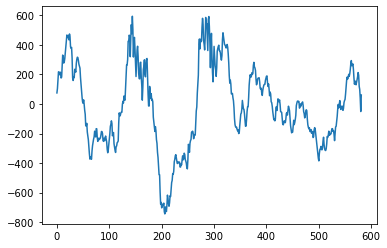

In [83]:
plt.plot(broadband_data[:,66])

In [204]:
ArtifactDetection & {'nwb_file_name' : nwb_copy_file_name} & {'sort_interval_name' : sort_interval_name} 
                       & {'sort_group_id' : tetrode}
                       & {'artifact_params_name': artifact_params_name})
                       

nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,artifact_params_name,artifact_times np array of artifact intervals,artifact_removed_valid_times np array of valid no-artifact intervals,artifact_removed_interval_list_name name of the array of no-artifact valid time intervals
molly20220416_.nwb,101,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,ampl_150_prop_04_2ms,=BLOB=,=BLOB=,molly20220416_.nwb_02_Seq2Session1_101_franklab_tetrode_hippocampus_ampl_150_prop_04_2ms_artifact_removed_valid_times


In [205]:
import spikeinterface as si

tetrode=101
session_name='02_Seq2Session1'
sort_interval_name='02_Seq2Session1'
artifact_params_name='ampl_150_prop_04_2ms'

'''get session start time'''
session_start_end=(IntervalList & {'nwb_file_name' : nwb_copy_file_name,'interval_list_name':session_name}).fetch1('valid_times')

'''obtain neural data'''
recording_path = (SpikeSortingRecording & {'nwb_file_name' : nwb_copy_file_name,
                                               'sort_interval_name' : sort_interval_name,
                                               'sort_group_id' : tetrode}).fetch1('recording_path')
recording = si.load_extractor(recording_path)
if recording.get_num_segments() > 1 and isinstance(recording, si.AppendSegmentRecording):
    recording = si.concatenate_recordings(recording.recording_list)
elif recording.get_num_segments() > 1 and isinstance(recording, si.BinaryRecordingExtractor):
    recording = si.concatenate_recordings([recording])
neural_t = SpikeSortingRecording._get_recording_timestamps(recording)


'''broad band data'''
broadband_nwb=(LFP() & {'nwb_file_name' : nwb_copy_file_name}).fetch_nwb()[0]
broadband_t=broadband_nwb['lfp'].timestamps

'''ripple band data'''
filter_name = 'Ripple 150-250 Hz'
ripple_nwb = (LFPBand & {'nwb_file_name': nwb_copy_file_name,
                             'target_interval_list_name': interval_list_name,
                             'filter_name': filter_name}).fetch_nwb()[0]
ripple_t=ripple_nwb['filtered_data'].timestamps


'''artifact time'''
artifact_plot_time = (ArtifactDetection 
                       & {'nwb_file_name' : nwb_copy_file_name} 
                       & {'sort_interval_name' : sort_interval_name} 
                       & {'sort_group_id' : tetrode}
                       & {'artifact_params_name': artifact_params_name}).fetch1('artifact_times')

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_FAT9AKG1K4.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_3VNDUKRCP7.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)


In [241]:
len(artifact_plot_times_)

27

47
artifact data []
15
now detected []
7
now detected [1.65013767e+09 1.65013767e+09 1.65013767e+09 1.65013767e+09
 1.65013767e+09 1.65013767e+09]


/tmp/ipykernel_1124172/1795484355.py:53: RuntimeWarning: invalid value encountered in true_divide
  ripple_data_=(ripple_data_-ripple_data_.mean())/(ripple_data_.max()-ripple_data_.min())


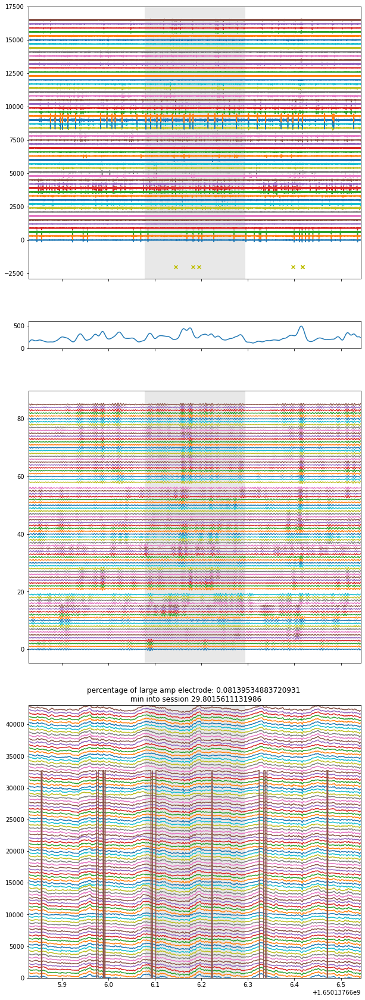

In [281]:
ripple_num=ripple_num+1
#ripple_num=41
print(ripple_num)
offset=0.25

plottimes = [ripple_times.loc[ripple_num].start_time - offset,
             ripple_times.loc[ripple_num].end_time + offset] 
# Spike band
neural_t=neural_ts[g]
recording=recordings[g]
orig_time_ind = np.argwhere(np.logical_and(neural_t >= plottimes[0], neural_t < plottimes[1])).ravel()
neural_data = recording.get_traces(start_frame=orig_time_ind[0], end_frame=orig_time_ind[-1]+1)
neural_time=neural_t[orig_time_ind]
time_into_recording=(np.mean(plottimes)-session_start_end[0][0])/60

# LFP band data
broad_lfp_ind = np.argwhere(np.logical_and(broadband_t >= plottimes[0], broadband_t < plottimes[1])).ravel()
broadband_data = broadband_nwb['lfp'].data[broad_lfp_ind,:]
broadband_time = broadband_t[broad_lfp_ind]

# Ripple band data
ripple_t_ind = np.argwhere(np.logical_and(ripple_t >= plottimes[0], ripple_t < plottimes[1])).ravel()
ripple_data = ripple_lfp_nwb['filtered_data'].data[ripple_t_ind,:]
ripple_time = ripple_t[ripple_t_ind]

# Consensus
ripple_consensus_trace = get_Kay_ripple_consensus_trace(
    ripple_data, ripple_lfp_nwb['lfp_band_sampling_rate'],smoothing_sigma=0.004)

# Artifact times
artifact_data=[at for at in artifact_plot_times if np.logical_and(at[0]>=plottimes[0],at[1]<=plottimes[1])]
print('artifact data', artifact_data)
# TO DO: Consensus, MUA

fig, axes = plt.subplots(nrows=4,gridspec_kw={'height_ratios': [10,1,10,10]},sharex=True,figsize=(10,30))
numtrodes=np.shape(neural_data)[1]
for i in range(numtrodes):
    axes[0].plot(neural_time, neural_data[:,i]+i*300)

axes[1].plot(ripple_time,ripple_consensus_trace)
axes[1].set_ylim(0,600)

numtrodes=np.shape(broadband_data)[1]
for i in range(numtrodes):
    #broadband_data_=broadband_data[:,i]
    #broadband_data_=(broadband_data_-broadband_data_.mean())/(broadband_data_.max()-broadband_data_.min())
    axes[3].plot(broadband_time, broadband_data[:,i]+i*500)
axes[3].set_ylim(0,numtrodes*500)

numtrodes=np.shape(ripple_data)[1]
for i in range(numtrodes):
    ripple_data_=ripple_data[:,i]
    ripple_data_=(ripple_data_-ripple_data_.mean())/(ripple_data_.max()-ripple_data_.min())
    axes[2].plot(ripple_time, ripple_data_+i*1)

# times when more than 20 tetrodes of more than >150 uV
largenum=np.sum(np.abs(neural_data)>50,axis=1)
print(np.max(largenum))
artifact_plot_times_=neural_time[np.argwhere(largenum>=30).ravel()]
print('now detected',artifact_plot_times_)

if len(artifact_plot_times_)>0:
    axes[0].scatter(artifact_plot_times_, np.repeat(-1000,len(artifact_plot_times_)),marker='x',color='r')

largenum=np.sum(np.abs(neural_data)>100,axis=1)
print(np.max(largenum))
artifact_plot_times_=neural_time[np.argwhere(largenum>=5).ravel()]
print('now detected',artifact_plot_times_)

if len(artifact_plot_times_)>0:
    axes[0].scatter(artifact_plot_times_, np.repeat(-2000,len(artifact_plot_times_)),marker='x',color='y')


'''
# start and end time of artifact
if len(artifact_data)>0:
    for artifact_t in artifact_data:
        axes[0].scatter(artifact_t[0], 500,marker='x',color='y')
        axes[0].scatter(artifact_t[1], 500,marker='x',color='r')
'''

plt.xlim(plottimes[0],plottimes[1])
plt.title('percentage of large amp electrode: '+str(np.max(largenum)/numtrodes)+' \n min into session '+str(time_into_recording))

axes[0].axvspan(plottimes[0]+offset,plottimes[1]-offset, zorder=-1, alpha=0.5, color='lightgrey')
axes[2].axvspan(plottimes[0]+offset,plottimes[1]-offset, zorder=-1, alpha=0.5, color='lightgrey')
axes[3].axvspan(plottimes[0]+offset,plottimes[1]-offset, zorder=-1, alpha=0.5, color='lightgrey')

       

### insert into Spyglass

In [1]:
from spyglass.Analysis_SGU import RippleTimes

Connecting shijiegu@lmf-db.cin.ucsf.edu:3306
